# Structure from Motion (SfM) Project

## Overview

Structure from Motion (SfM) is a photogrammetric technique used in computer vision and robotics to reconstruct a three-dimensional (3D) structure from a set of two-dimensional (2D) images taken from different viewpoints. The key idea behind SfM is that by analyzing the motion of the camera across multiple images, it is possible to infer the 3D coordinates of points in the scene as well as the camera's position and orientation at each image capture.

SfM is widely used in various applications, including 3D modeling, augmented reality, autonomous navigation, and even in the creation of digital maps from aerial photography.

## Problem Statement

Given a series of images of an object or scene taken from different viewpoints, the goal of the SfM problem is to recover both the 3D coordinates of the points in the scene and the camera's positions and orientations. This is achieved by identifying corresponding points (features) across the images and using mathematical techniques to triangulate the 3D positions of these points.

### Mathematical Foundation

The core of the SfM process involves several key mathematical concepts:

1. **Feature Detection and Matching**:
   - The first step in SfM is to detect keypoints (distinctive points or features) in each image and match them across multiple images. Common algorithms used for feature detection include SIFT (Scale-Invariant Feature Transform) and ORB (Oriented FAST and Rotated BRIEF).
   
2. **Epipolar Geometry**:
   - Epipolar geometry describes the geometric relationship between two views of the same 3D point. The **fundamental matrix** and **essential matrix** are key concepts that encode this relationship. These matrices are used to constrain where the corresponding point in one image can be found in another image.

3. **Camera Projection Matrix**:
   - The camera projection matrix models how 3D points in the world are projected onto the 2D image plane. This matrix encapsulates both the intrinsic parameters (focal length, principal point, etc.) and the extrinsic parameters (rotation and translation) of the camera.

4. **Triangulation**:
   - Triangulation is the process of determining the 3D coordinates of a point by finding the intersection of two or more rays that originate from the camera centers and pass through the corresponding 2D points in the images. This is typically done using a method known as **linear triangulation**.

5. **Bundle Adjustment**:
   - Bundle adjustment is an optimization technique used to refine the 3D structure and camera parameters by minimizing the re-projection error. This error is the difference between the observed 2D image points and the projected points from the estimated 3D structure.

## Project Goals

In this project, we will implement the basic steps of the Structure from Motion pipeline, including:

- Detecting and matching features across multiple images.
- Estimating the essential matrix and recovering the relative camera poses.
- Triangulating the 3D positions of matched points.
- Visualizing the reconstructed 3D point cloud.

The final output will be a 3D point cloud representation of the scene, which will be visualized using tools such as Plotly.

## References

- Hartley, R., & Zisserman, A. (2004). *Multiple View Geometry in Computer Vision*. Cambridge University Press.
- Szeliski, R. (2010). *Computer Vision: Algorithms and Applications*. Springer.

**Nico Fidalgo**

### Setup

**Import Libraries**

In order to set up the project, first import the following list of libraries.

In [1]:
import requests
import pickle
from pupil_apriltags import Detector
import numpy as np
import glob
import matplotlib.pyplot as plt
import cv2
import plotly.graph_objects as go

**Camera Calibration**

Next, it is crucial that the camera that is used for data capture is calibrated. The output of the following cell is the camera calibration matrix (intrinsic parameters) $K$. This matrix is important for finding the essential matrices later, as well as to compute the camera positions.

The first step to do this is to access the target IDs of the april boards stored in a GitHub repository and store them in `at_coarseboard` and `at_fineboard`.

In [2]:
# Get target IDs for april boards from Git repo
response = requests.get("https://github.com/Harvard-CS283/pset-data/raw/f1a90573ae88cd530a3df3cd0cea71aa2363b1b3/april/AprilBoards.pickle")
data = pickle.loads(response.content)
at_coarseboard = data['at_coarseboard']
at_fineboard = data['at_fineboard']

Next, use the `detect_aprilboard()` function to search the input image `img`, depending on which type of aprilboard was used `board`, and the parameters of the apriltag detector `apriltag_detector`. The output is an $N\times2$ Numpy array of $(x,y)$ image coordinates `imgpoints`, an $N\times3$ Numpy array of $(X,Y,Z=0)$ board coordinates (in inches) `objpoints`, and an $N\times1$ list of tag IDs `tag_ids`.

In [3]:
# Helper function for detecting april boards
at_detector = Detector(families='tag36h11',
                       nthreads=1,
                       quad_decimate=1.0,
                       quad_sigma=0.0,
                       refine_edges=1,
                       decode_sharpening=0.25,
                       debug=0)

def detect_aprilboard(img, board, at_detector):
    """
    Detects april tags in a grayscale image.

    Args:
        img: grayscale image
        board: at_coarseboard or at_fineboard (list of dictionaries)
        at_detector: april tag detector parameters

    Returns:
        imgpoints: Nx2 numpy array of (x,y) image coordinates
        objpoints: Nx3 numpy array of (X,Y,0) board coordinates (in inches)
        tag_ids: Nx1 list of tag IDs
    """
    imgpoints=[]
    objpoints=[]
    tag_ids=[]
    imgtags = at_detector.detect(img,
                                    estimate_tag_pose=False,
                                    camera_params=None,
                                    tag_size=None)
    if len(imgtags):
        brdtagIDs = [ sub['tag_id'] for sub in board ]
        imgtagIDs = [ sub.tag_id for sub in imgtags ]
        tag_ids = list(set(brdtagIDs).intersection(imgtagIDs))
        if len(tag_ids):
            objs=list(filter(lambda tagnum: tagnum['tag_id'] in tag_ids, board))
            objpoints = np.vstack([ sub['center'] for sub in objs ])
            imgs=list(filter(lambda tagnum: tagnum.tag_id in tag_ids, imgtags))
            imgpoints = np.vstack([ sub.center for sub in imgs ])

    return imgpoints, objpoints, tag_ids

Next, call the `detect_aprilboard()` function.

18 images:
0 ./media/calib/keyframe_0001.jpg: 80 imgpts, 80 objpts
1 ./media/calib/keyframe_0012.jpg: 80 imgpts, 80 objpts
2 ./media/calib/keyframe_0004.jpg: 0 imgpts, 0 objpts
3 ./media/calib/keyframe_0009.jpg: 80 imgpts, 80 objpts
4 ./media/calib/keyframe_0018.jpg: 80 imgpts, 80 objpts
5 ./media/calib/keyframe_0014.jpg: 80 imgpts, 80 objpts
6 ./media/calib/keyframe_0017.jpg: 80 imgpts, 80 objpts
7 ./media/calib/keyframe_0013.jpg: 80 imgpts, 80 objpts
8 ./media/calib/keyframe_0016.jpg: 80 imgpts, 80 objpts
9 ./media/calib/keyframe_0007.jpg: 80 imgpts, 80 objpts
10 ./media/calib/keyframe_0002.jpg: 80 imgpts, 80 objpts
11 ./media/calib/keyframe_0015.jpg: 80 imgpts, 80 objpts
12 ./media/calib/keyframe_0008.jpg: 80 imgpts, 80 objpts
13 ./media/calib/keyframe_0006.jpg: 80 imgpts, 80 objpts
14 ./media/calib/keyframe_0005.jpg: 80 imgpts, 80 objpts
15 ./media/calib/keyframe_0011.jpg: 80 imgpts, 80 objpts
16 ./media/calib/keyframe_0010.jpg: 80 imgpts, 80 objpts
17 ./media/calib/keyframe_0003.j

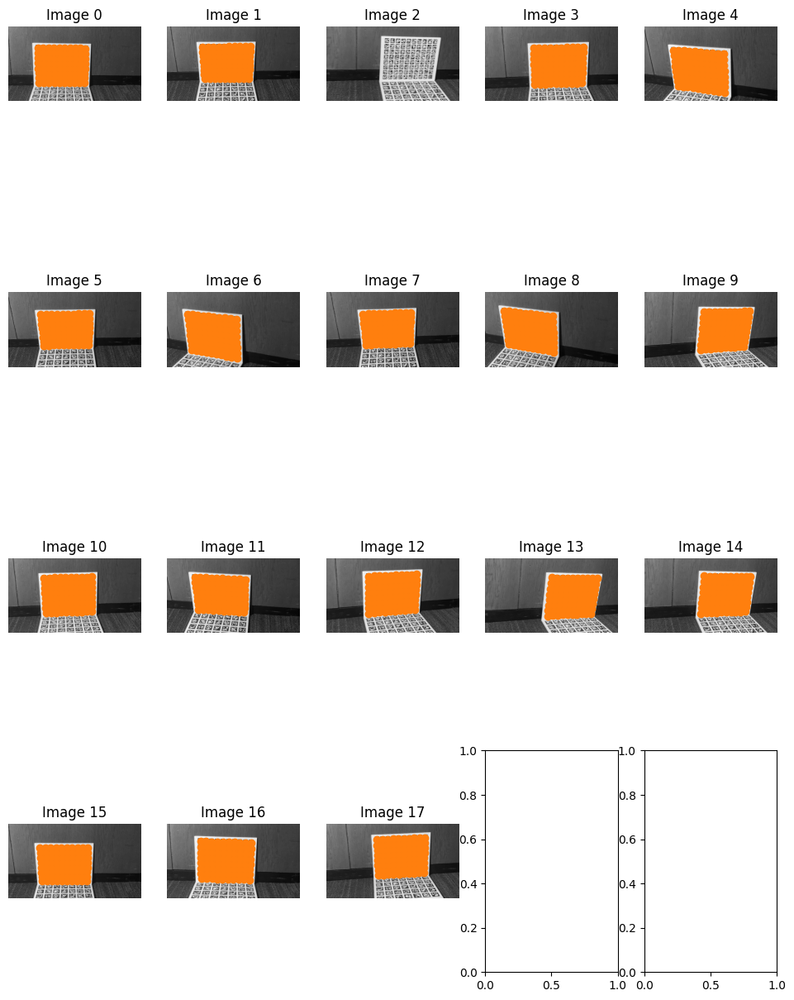

In [4]:
# Detect fiducials
# Check to make sure that the algorithm is able to recognize
# a high enough margin of them so that one board will 
# sufficiently calibrate the camera

N = 70
total_valid = 0
CALIBFILES = './media/calib/keyframe_*.jpg'
BOARD = at_fineboard
images = glob.glob(CALIBFILES)
assert images, "no calibration images matching: " + CALIBFILES
assert BOARD==at_fineboard or BOARD==at_coarseboard, "Unrecognized AprilBoard"
print("{} images:".format(len(images)))

calObjPoints = []
calImgPoints = []
num_plot_cols = 5
num_plot_rows = (len(images) + num_plot_cols - 1) // num_plot_cols
fig, axs = plt.subplots(num_plot_rows, num_plot_cols, figsize=(12, 4*num_plot_rows))
axs = axs.flatten()

for count,fname in enumerate(images):
    orig = cv2.imread(fname)
    if len(orig.shape) == 3:
        img = cv2.cvtColor(orig, cv2.COLOR_RGB2GRAY)
    else:
        img = orig

    axs[count].imshow(img / 255.0, cmap="gray")
    axs[count].set_axis_off()
    axs[count].set_title("Image {}".format(count))
    imgpoints, objpoints, tag_ids = detect_aprilboard(img,BOARD,at_detector)
    print(f"{count} {fname}: {len(imgpoints)} imgpts, {len(objpoints)} objpts")
    if len(imgpoints) >= N and len(objpoints) >= N:
        total_valid += 1
        axs[count].scatter(imgpoints[:,0], imgpoints[:,1], marker='o', color='#ff7f0e')
        calObjPoints.append(objpoints.astype('float32'))
        calImgPoints.append(imgpoints.astype('float32'))

Lastly, call OpenCV's `calibrateCamera()` function to retrieve the camera's calibration matrix and store it in `calMatrix`.

In [5]:
# Find calibration matrix

reprojerr, calMatrix, distCoeffs, calRotations, calTranslations = cv2.calibrateCamera(
    calObjPoints,
    calImgPoints,
    img.shape,
    None,
    None,
    flags = None)

np.set_printoptions(precision=5, suppress=True)
print('RMSE of reprojected points:', reprojerr)
print('Distortion coefficients:', distCoeffs)

np.set_printoptions(precision=2, suppress=True)
print('Intrinsic camera matrix:\n', calMatrix)
print('Total images used for calibration: ', total_valid)

RMSE of reprojected points: 0.30852550691322833
Distortion coefficients: [[ 0.16133 -0.7031   0.00319 -0.01442  0.15127]]
Intrinsic camera matrix:
 [[2983.43    0.    856.73]
 [   0.   2950.48  661.82]
 [   0.      0.      1.  ]]
Total images used for calibration:  17


For testing, visualize the `detect_aprilboard()` function using one of the calibration images.

./media/calib/keyframe_0001.jpg, fine: 80 imgpts, 80 objpts


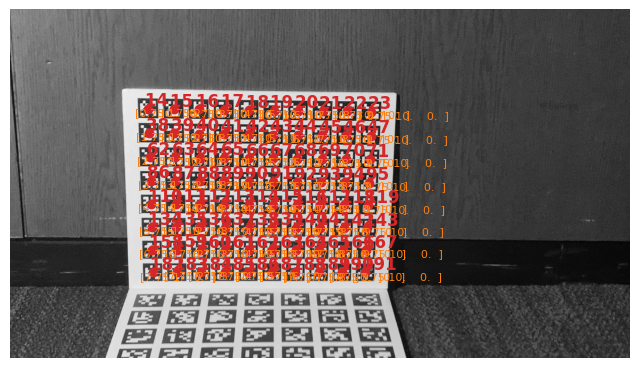

In [6]:
# Calling detect_aprilboard() with sample image
fname = './media/calib/keyframe_0001.jpg'
orig = cv2.imread(fname)
if len(orig.shape) == 3:
    img = cv2.cvtColor(orig, cv2.COLOR_RGB2GRAY)
else:
    img = orig

imgpoints_test, objpoints_test, tag_ids_test = detect_aprilboard(img, at_fineboard, at_detector)
print("{}, fine: {} imgpts, {} objpts".format(fname, len(imgpoints_test),len(objpoints_test)))
fig,ax =  plt.subplots(figsize=(8,12))
plt.imshow(img / 255.0, cmap="gray")
plt.axis('off')
for i in range(len(imgpoints_test)):
    ax.plot(imgpoints_test[i,0], imgpoints_test[i,1],marker='o',color='#d62728')
    ax.text(imgpoints_test[i,0]-10,
            imgpoints_test[i,1]-10,
            "{} ".format(tag_ids_test[i]),
            color='#d62728',
            fontsize=12,
            fontweight='bold')
    ax.text(imgpoints_test[i,0]-40,
            imgpoints_test[i,1]+20,
            np.array2string(objpoints_test[i,:]),
            color='#ff7f0e',
            fontsize=8)

**Calibrating Camera for Testing Data**

It is also necessary to calibrate the camera used in the testing data as it was relied on for testing functions throughout the rest of the project.

In [7]:
CALIBFILE = "./test/calib/playroom_es143_small_calib.pickle"
BOARDFILE = "./test/calib/AprilBoards.pickle"

# Import calibration data
data = pickle.load(open(CALIBFILE, 'rb'))
calMatrix_test = data['calMatrix']
distCoeffs_test = data['distCoeffs']
print(f"Test calibration matrix:\n{calMatrix_test}")

# Import april board data
data = pickle.load(open(BOARDFILE, 'rb'))
at_coarseboard = data['at_coarseboard']
at_fineboard = data['at_fineboard']

Test calibration matrix:
[[753.15   0.   378.14]
 [  0.   753.08 499.72]
 [  0.     0.     1.  ]]


### Detecting Key Features

The first step of the structure from motion problem is to detect key features in two images and match them to one another.

In the following cell are two helper functions, `in2hom()` and `hom2in()` which convert to and from homogeneous and inhomogeneous coordinates.

In [8]:
def in2hom(X):
    """
    Converts from Nxm inhomogeneous coordinates to Nx(m+1) homogeneous coordinates

    Args:
        X: Nxm matrix in inhomogeneous coordinates
    
    Returns:
        Array: Nx(m+1) homogeneous coordinates
    """
    if X.ndim == 1:
        X = X.reshape(1, -1)
    return np.concatenate([X, np.ones((X.shape[0], 1), dtype=np.float32)], axis=1)

def hom2in(X):
    """
    Converts from Nxm homogeneous coordinates to Nx(m-1) inhomogeneous coordinates.

    Args:
        X: Nxm matrix in homogeneous coordinates
    
    Returns:
        Array: Nx(m-1) matrix in inhomogeneous coordinates
    """
    return X[:, :-1] / X[:, -1:]

**SIFT Algorithm for Feature Detection**

First I implemented a SIFT algorithm for feature detection for its efficiency, forgiveness, and ease of implementation. For now, I did not write this into a function as I was testing with a single image pair as opposed to adding multiple views which will add much more complexity.

**Brute Force Approach for Feature Matching**

I initially implemented a brute force matching technique for pairing key features across the two images. This decision was made due to the ease of implementation and the sanity check that all possible matches would be checked, reducing risk of ignoring a potential match due to a limited search space.

**Discussion**

I ended up with plenty of matches as intended. However, as can be seen from the visualization of the matches, many were very poor, mapping points from the backpack to the chair, or the sunglasses to the chair, etc. This inaccuracy needs to be handled, and to do so I implemented a RANSAC approach.

Shape of pts1: (795, 2)
Shape of pts2: (795, 2)


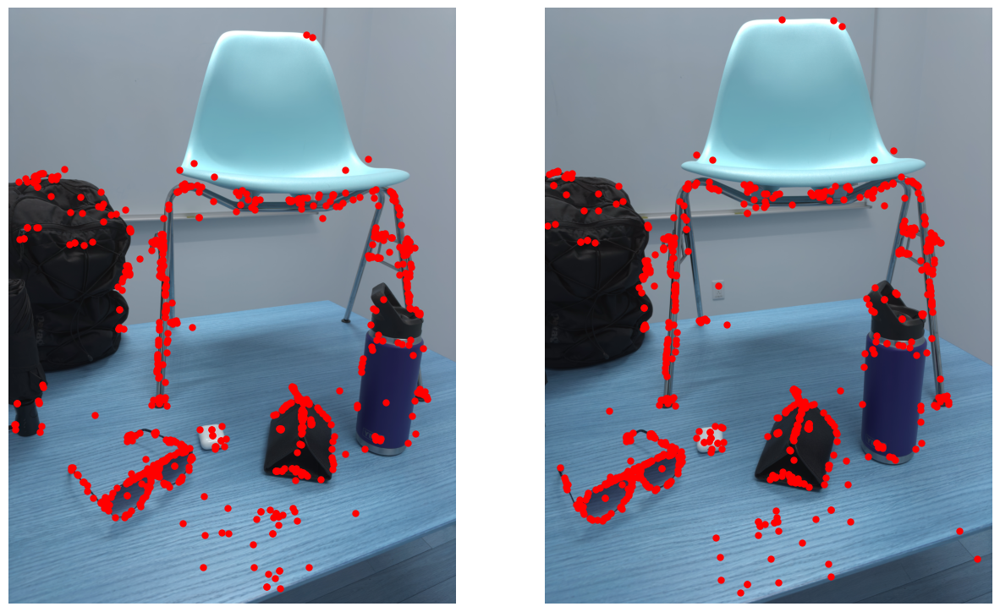

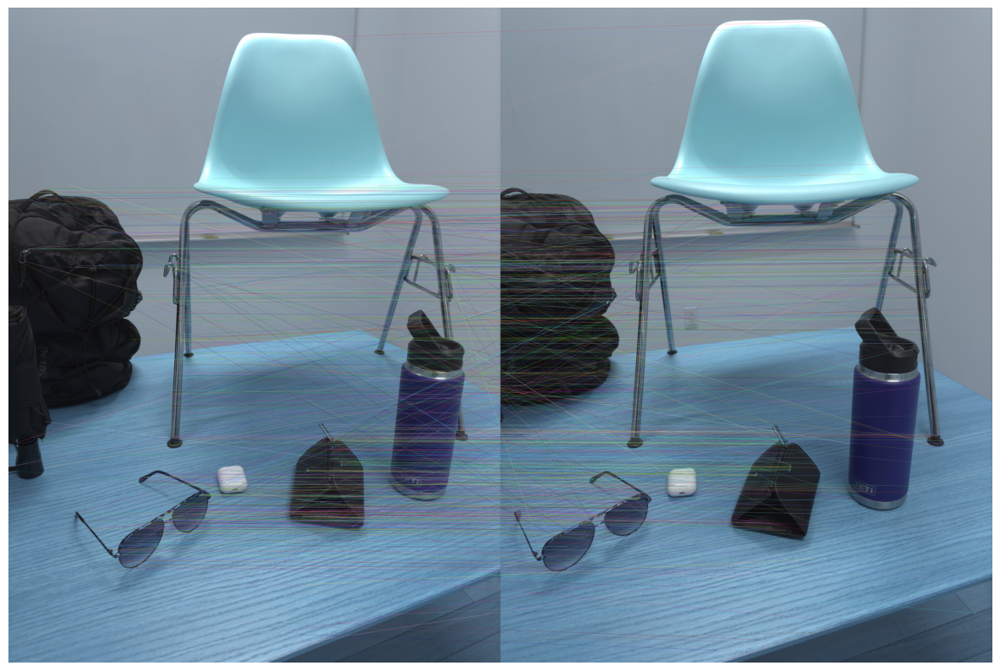

In [9]:
# Top percent of matches to keep
GOOD_MATCH_PERCENT = 0.20

# Read in two images
im1 = cv2.imread("./media/mixed2_keyframes/IMG_2273.jpg")
im2 = cv2.imread("./media/mixed2_keyframes/IMG_2274.jpg")

# Create SIFT object
sift = cv2.SIFT_create()

# Get SIFT keypoints and descriptors for each image
kp1, des1 = sift.detectAndCompute(cv2.cvtColor(im1, cv2.COLOR_RGB2GRAY), None)
kp2, des2 = sift.detectAndCompute(cv2.cvtColor(im2, cv2.COLOR_RGB2GRAY), None)

# Create brute force matcher object using L2 norm
# Cross check to only keep symmetric matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Find matches between images
matches12 = bf.match(des1, des2)

# Sort matches in order of increasing match-distance; keep top ones
matches12 = sorted(matches12, key=lambda x: x.distance)
numGoodMatches = int(len(matches12) * GOOD_MATCH_PERCENT)
matches = matches12[:numGoodMatches]

# Get pixel coordinates of surviving matches
pts1 = np.array([kp1[match.queryIdx].pt for match in matches12])
pts2 = np.array([kp2[match.trainIdx].pt for match in matches12])

# Plot points overlaid on images
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.imshow(im1)
ax1.plot(pts1[:, 0], pts1[:, 1], '.r', markersize=10)
ax1.axis('off')
ax2.imshow(im2)
ax2.plot(pts2[:, 0], pts2[:, 1], '.r', markersize=10)
ax2.axis('off')

# Draw matches
imMatches = cv2.drawMatches(im1, kp1, im2, kp2, matches12, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.subplots(figsize=(15, 15))
plt.imshow(imMatches)
plt.axis('off')

print(f"Shape of pts1: {pts1.shape}")
print(f"Shape of pts2: {pts2.shape}")

**RANSAC for Improved Feature Matching**

Then I implemented RANSAC across the two image's matching points to mask out bad matches as outliers and retain only the good matches `inliers1` and `inliers2`. Then I inspected the shape of the inliers to ensure there were still enough to get a dense 3D point cloud in the end.

In [10]:
def find_best_fundamental_matrix(pts1, pts2, confidence=0.995, reproj_threshold=3.0):
    """
    Finds the fundamental matrix and inliers between two images via their matching features.

    Args:
        pts1: Nx2 2D image coordinates of features in image 1
        pts2: Nx2 2D image coordinates of features in image 2
        confidence: confidence interval within which the inliers must lie
        reproj_threshold: threshold of the allowed reprojection error

    Returns:
        F: fundamental matrix
        inliers1: Nx2 2D image coordinates of inliers in image 1
        inliers2: Nx2 2D image coordinates of inliers in image 2
    """
    # Find fundamental matrix and mask out outliers
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, reproj_threshold, confidence)

    # Take only inliers, filter out the outliers
    if mask is not None:
        inliers1 = pts1[mask.ravel() == 1]
        inliers2 = pts2[mask.ravel() == 1]
        return F, inliers1, inliers2
    else:
        return None, None, None

In [11]:
# Call function with pts1 and pts2
best_F, inliers1, inliers2 = find_best_fundamental_matrix(pts1, pts2)

# Inspect shapes
print(f"Number of inliers: {len(inliers1)}")
print(f"Best fundamental matrix:\n{best_F}")
print(f"Shape of pts1: {pts1.shape}")
print(f"Shape of pts2: {pts2.shape}")
print(f"Shape of inliers1: {inliers1.shape}")
print(f"Shape of inliers2: {inliers2.shape}")

Number of inliers: 183
Best fundamental matrix:
[[-0.   -0.    0.  ]
 [ 0.    0.   -0.03]
 [-0.01  0.03  1.  ]]
Shape of pts1: (795, 2)
Shape of pts2: (795, 2)
Shape of inliers1: (183, 2)
Shape of inliers2: (183, 2)


Then I inspected the accuracy of my RANSAC test by visualizing the inliers.

**Discussion**

As can be seen, the matches are very strong. Many of the bad matches have been filtered out via the mask used in `find_best_fundamental_matrix()`.

In [12]:
def plot_matches_with_inliers(img1, img2, pts1, pts2, inliers1, inliers2):
    """
    Plots the inlier matches between the two images.

    Args:
        img1: image 1
        img2: image 2
        pts1: Nx2 2D image coordinates of features in image 1
        pts2: Nx2 2D image coordinates of features in image 2
        inliers1: Nx2 2D image coordinates of inliers in image 1
        inliers2: Nx2 2D image coordinates of inliers in image 2
    """
    # Combine images side-by-side
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape
    height = max(h1, h2)
    width = w1 + w2
    
    combined_image = np.zeros((height, width, 3), dtype=np.uint8)
    combined_image[:h1, :w1, :] = img1
    combined_image[:h2, w1:w1+w2, :] = img2

    # Plot points
    plt.figure(figsize=(15, 15))
    plt.imshow(combined_image)
    plt.axis('off')

    # Plot all matches as blue points
    plt.plot(pts1[:, 0], pts1[:, 1], 'o', markersize=10, markeredgecolor='b', markerfacecolor='none', label='Outliers')
    plt.plot(w1 + pts2[:, 0], pts2[:, 1], 'o', markersize=10, markeredgecolor='b', markerfacecolor='none')

    # Overwrite all matches that are inliers as red points
    plt.plot(inliers1[:, 0], inliers1[:, 1], 'o', markersize=10, markeredgecolor='r', markerfacecolor='none', label='Inliers')
    plt.plot(w1 + inliers2[:, 0], inliers2[:, 1], 'o', markersize=10, markeredgecolor='r', markerfacecolor='none')

    # Draw lines between matches
    for (x1, y1), (x2, y2) in zip(inliers1, inliers2):
        plt.plot([x1, w1 + x2], [y1, y2], 'r-', linewidth=1)

    plt.legend()

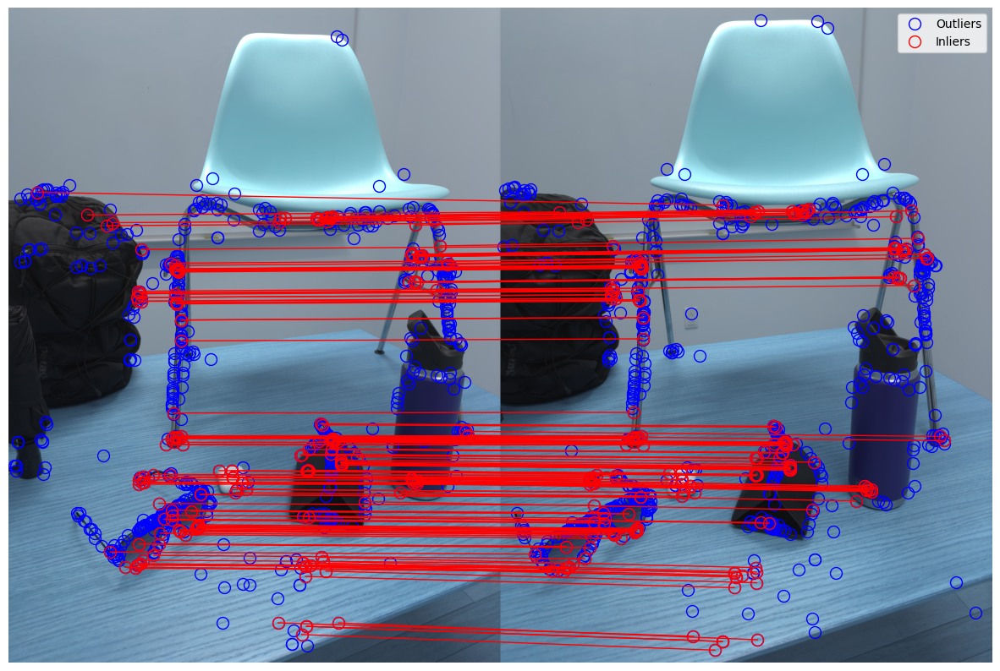

In [13]:
# Call function
plot_matches_with_inliers(im1, im2, pts1, pts2, inliers1, inliers2)

### Essential Matrix and Camera Positions

The next step is to compute the essential matrix $E$ that relates one camera to another and then the camera positions.

*Essential Matrix*: To do this, I wrote a function `find_essential_matrix()` that finds $E$ using the inliers derived from RANSAC, `inliers1` and `inliers2`. Finding the essential matrix and its mask was done using OpenCV's functions `findEssentialMat()`.

*Camera Matrices*: Then I wrote a function `compute_projection_matrices()` to find the camera matrices of the form $K[R | t]$ where $K$ represents the camera's intrinsic parameters, `calMatrix`, $R$ represents the $3\times3$ rotation matrix between camera 1 and camera 2, and $t$ represents the translation vector from camera 1 to camera 2.

In [14]:
def find_essential_matrix(pts1, pts2, K):
    """
    Finds the essential matrix using RANSAC from 2D point correspondences.

    Args:
        pts1: Nx2 2D image coordinates of inliers in image 1
        pts2: Nx2 2D image coordinates of inliers in image 2
        K: camera calibration matrix
    
    Returns:
        E: essential matrix
        mask: filter between image 1 and image 2
    """
    # Assert float to avoid errors with integer operations
    pts1 = pts1.astype(np.float32)
    pts2 = pts2.astype(np.float32)

    # Find E and mask
    E, mask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)

    if E is not None and E.shape == (3, 3):
        return E, mask
    else:
        return None, None
    
def compute_projection_matrices(K, E, pts1, pts2):
    """
    Computes the camera matrices from the inliers, K and E.

    Args:
        K: camera calibration matrix
        E: essential matrix
        pts1: Nx2 2D image coordinates of inliers in image 1
        pts2: Nx2 2D image coordinates of inliers in image 2

    Returns:
        P1: camera matrix of image 1
        P2: camera matrix of image 2
    """
    # Decompose the essential matrix to get R and t
    _, R, t, _ = cv2.recoverPose(E, pts1, pts2, K)
    t_normalized = t / np.linalg.norm(t)

    # First camera at origin [I | 0]
    P1 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))

    # Second camera at [R | t]
    P2 = K @ np.hstack((R, t_normalized.reshape(3, 1)))

    return P1, P2

In [15]:
# Call functions
E, mask = find_essential_matrix(inliers1, inliers2, calMatrix)
print(f"Essential matrix:\n{E}")
print(f"Inliers shape: {inliers1.shape}")

P1, P2 = compute_projection_matrices(calMatrix, E, inliers1, inliers2)
print(f"Camera 1 matrix:\n{P1}")
print(f"Camera 2 matrix:\n{P2}")

Essential matrix:
[[-0.   -0.05  0.06]
 [ 0.07 -0.   -0.7 ]
 [-0.09  0.7  -0.01]]
Inliers shape: (183, 2)
Camera 1 matrix:
[[2983.43    0.    856.73    0.  ]
 [   0.   2950.48  661.82    0.  ]
 [   0.      0.      1.      0.  ]]
Camera 2 matrix:
[[ 2949.92   114.5    959.02 -3026.54]
 [ -132.66  2950.79   647.01  -293.47]
 [   -0.03     0.       1.      -0.07]]


### 3D Point Triangulation

The last step of the structure from motion pipeline is to triangulate the world 3D coordinates using the camera matrices and inliers. To do this, I implemented the following function `triangulate_points()`.

In [16]:
def triangulate_points(pts1, pts2, mask, P1, P2):
    """
    Triangulates world 3D coordinates from 2D image coordinates and camera positions.

    Args:
        pts1: Nx2 2D image coords of inliers in image 1
        pts2: Nx2 2D image coords of inliers in image 2
        mask: filter between image 1 and iamge 2
        P1: camera matrix for image 1
        P2: camera matrix for iamge 2
    
    Returns:
        points_3d: Nx3 3D world coordinates of matching inliers from iamge 1 and image 2
    """
    pts1_filtered = pts1[mask.ravel() == 1]
    pts2_filtered = pts2[mask.ravel() == 1]

    pts1_hom = in2hom(pts1_filtered).T
    pts2_hom = in2hom(pts2_filtered).T

    points_4d_hom = cv2.triangulatePoints(P1, P2, pts1_hom[:2], pts2_hom[:2])
    points_3d = points_4d_hom[:3] / points_4d_hom[3]

    return points_3d.T

In [17]:
# Call function
points_3d = triangulate_points(inliers1, inliers2, mask, P1, P2)
print(f"First 5 points: \n{points_3d[:5]}")

First 5 points: 
[[0.63 5.61 2.65]
 [1.44 5.77 2.96]
 [1.7  6.77 4.32]
 [6.13 3.83 5.88]
 [3.24 5.81 3.54]]


### Plot Results

Now it is time to visualize the final output. I inspected the original plot using the range from the minimum and maximum (x,y,z) values, but due to some background points being triangulated far from the rest, behaving like an outlier, I adjusted the axes so the final output is more noticeable. As can be seen, one object is clear, the sunglasses, which had the most dense cluster of inliers compared to the other objects in the scene.

In [18]:
x_filtered, y_filtered, z_filtered = points_3d[:, 0], points_3d[:, 1], points_3d[:, 2]
fig = go.Figure(data=[go.Scatter3d(x=x_filtered, y=y_filtered, z=z_filtered, mode='markers', marker=dict(size=2, color='blue', colorscale='Viridis', opacity=0.8))])
fig.update_layout(title='3D Point Cloud from SfM', autosize=False, width=800, height=800, margin=dict(l=65, r=50, b=65, t=90), scene=dict(xaxis=dict(range=[min(x_filtered), max(x_filtered)]), yaxis=dict(range=[min(y_filtered), max(y_filtered)]), zaxis=dict(range=[min(z_filtered), max(z_filtered)])))
fig.show()

### What makes good data?

Across the duration of this project I collected over 500 pictures of 20 different scenes and struggled to achieve a better output than the visualization of the `mixed2` scene constructed with two images for the demo above.

*Challenges*
* Too few/many key features detected with SIFT
* Brute force matching time complexity
* Too few inliers retained requiring individualized tuning of hyperparameters of RANSAC algorithm

Below is a walkthrough of these challenges.

**Too many key features detected with SIFT**

I captured this data of my friend believing that  Iwould capture many key features, although with all the different books in the background and the repeated pattern on his sweater, this dataset detected too many key features. As a result, finding the inliers was infeasible. After 11 minutes of runtime, I elected to interrupt the kernel.

### Testing on Dataset with More Features

When I tested my pipeline on a different dataset, the result was much easier to understand due to the cluster of points where the fiducial boards are located, making it easy to orient yourself in the point cloud. As a result of this success, I elected to move forward with this dataset and add cameras to it.

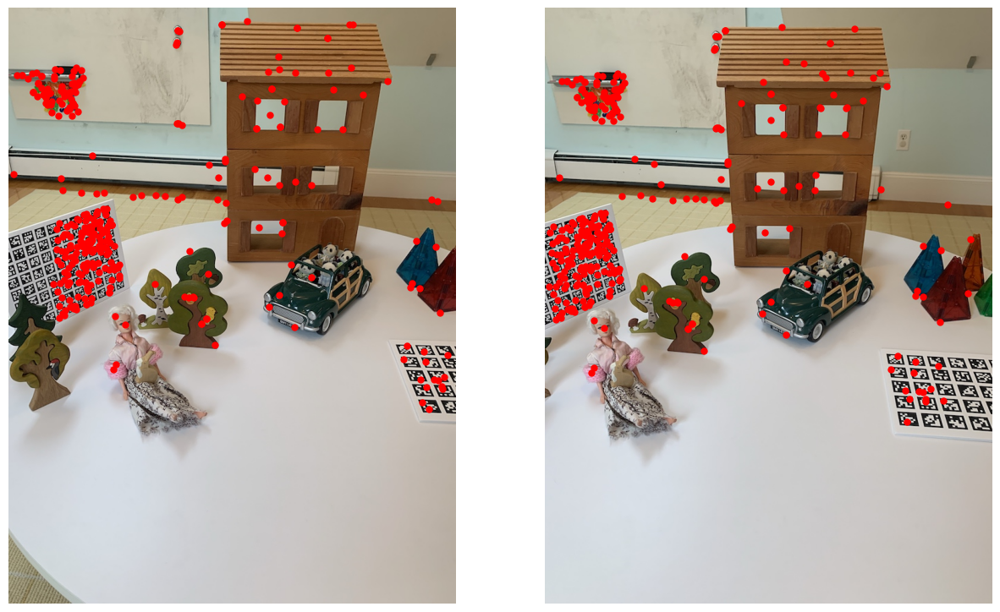

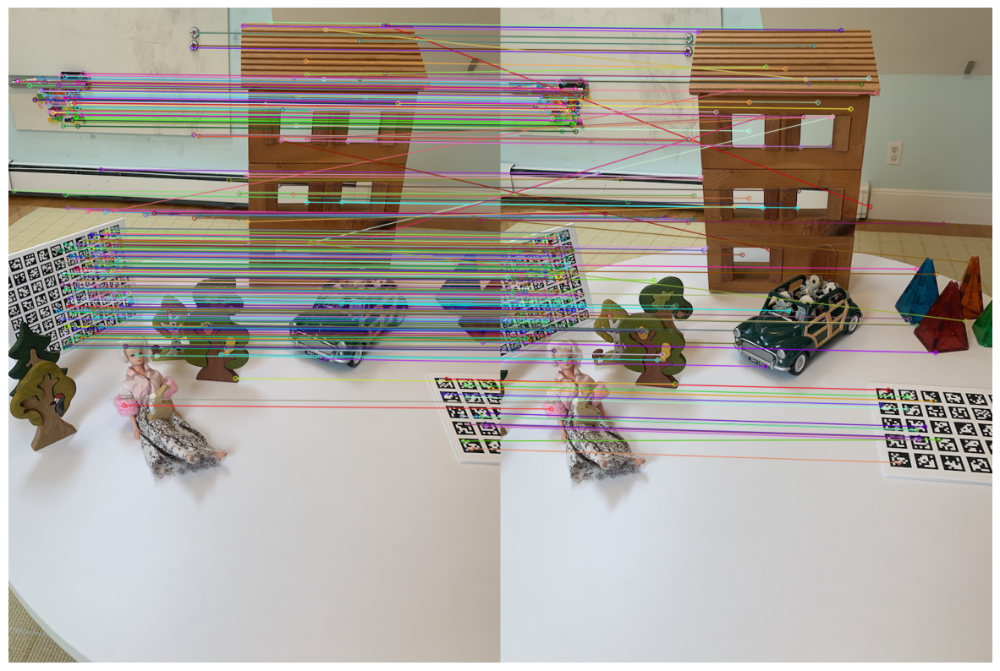

Shape of pts:  (342, 2)
Shape of inliers:  (313, 2)
Essential Matrix: 
 [[ 0.   -0.02 -0.02]
 [ 0.05  0.01 -0.71]
 [ 0.03  0.71  0.01]]
Inliers shape:  (313, 2)
Camera 1 Matrix: 
 [[753.15   0.   378.14   0.  ]
 [  0.   753.08 499.72   0.  ]
 [  0.     0.     1.     0.  ]]
Camera 2 Matrix: 
 [[ 735.29  -15.9   411.49 -760.96]
 [  -9.76  749.07  505.61    6.9 ]
 [  -0.04   -0.01    1.     -0.02]]
First 5 Points: 
 [[  1.87  -3.82   7.19]
 [ -9.24 -10.92  20.98]
 [ -7.55 -10.19  21.35]
 [ -3.87  -5.49  22.23]
 [  1.57  -4.51   7.55]]


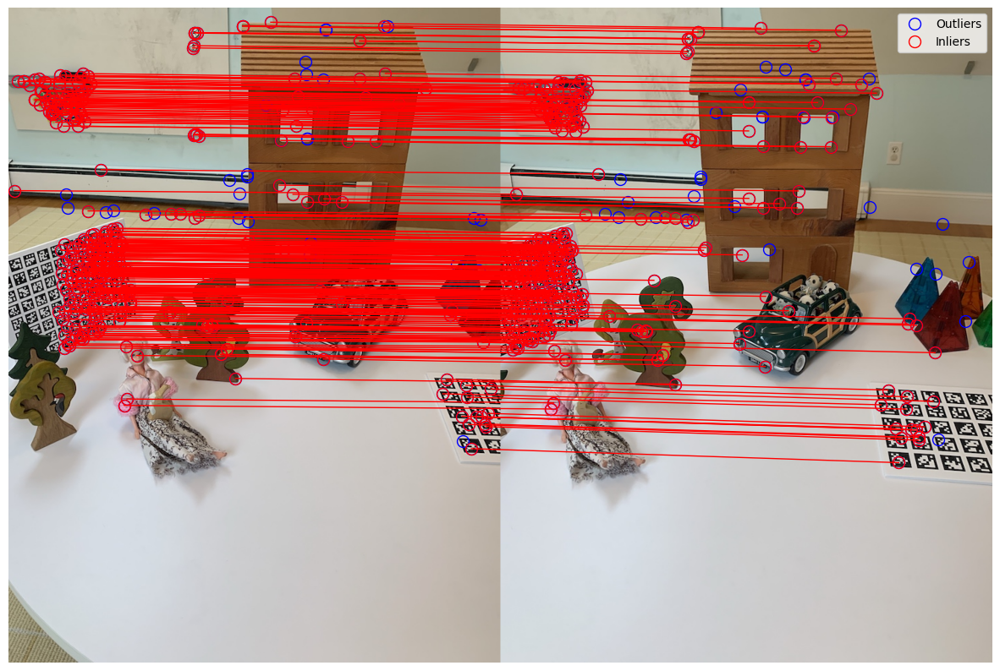

In [19]:
GOOD_MATCH_PERCENT=0.30

im1 = cv2.imread('./test/playroom_es143_small_00002.JPG')
im2 = cv2.imread('./test/playroom_es143_small_00003.JPG')
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(cv2.cvtColor(im1, cv2.COLOR_RGB2GRAY), None)
kp2, des2 = sift.detectAndCompute(cv2.cvtColor(im2, cv2.COLOR_RGB2GRAY), None)

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches12 = bf.match(des1, des2)

matches12 = sorted(matches12, key = lambda x:x.distance)
numGoodMatches = int(len(matches12) * GOOD_MATCH_PERCENT)
matches12 = matches12[:numGoodMatches]

pts1 = np.array([kp1[match.queryIdx].pt for match in matches12])
pts2 = np.array([kp2[match.trainIdx].pt for match in matches12])

_, (ax1,ax2) = plt.subplots(1,2,figsize=(15,15))
ax1.imshow(im1)
ax1.plot(pts1[:, 0], pts1[:, 1], '.r', markersize=10)
ax1.axis('off')
ax2.imshow(im2)
ax2.plot(pts2[:, 0], pts2[:, 1], '.r', markersize=10)
ax2.axis('off')

imMatches = cv2.drawMatches(im1,kp1,im2,kp2,matches12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.subplots(figsize=(15,15))
plt.imshow(imMatches)
plt.axis('off')
plt.show()

print("Shape of pts: ", pts1.shape)

best_F, inliers1, inliers2 = find_best_fundamental_matrix(pts1, pts2, confidence=0.995, reproj_threshold=3.0)

print("Shape of inliers: ", inliers1.shape)

plot_matches_with_inliers(im1, im2, pts1, pts2, inliers1, inliers2)

# Call essential matrix function
E, mask = find_essential_matrix(inliers1, inliers2, calMatrix_test)
print("Essential Matrix: \n", E)
print("Inliers shape: ", inliers1.shape)

# Call camera matrix function
P1, P2 = compute_projection_matrices(calMatrix_test, E, inliers1, inliers2)
print("Camera 1 Matrix: \n", P1)
print("Camera 2 Matrix: \n", P2)

points_3d = triangulate_points(inliers1, inliers2, mask, P1, P2)
print("First 5 Points: \n", points_3d[:5])

x, y, z = points_3d[:, 0], points_3d[:, 1], points_3d[:, 2]

x_filtered, y_filtered, z_filtered = points_3d[:, 0], points_3d[:, 1], points_3d[:, 2]

fig = go.Figure(data=[go.Scatter3d(x=x_filtered, y=y_filtered, z=z_filtered, mode='markers', marker=dict(size=2, color=z, colorscale='Viridis', opacity=0.8))])
fig.update_layout(title='3D Point Cloud from SfM', autosize=False, width=800, height=800, margin=dict(l=65, r=50, b=65, t=90), scene=dict(xaxis=dict(range=[min(x_filtered), max(x_filtered)]), yaxis=dict(range=[min(y_filtered), max(y_filtered)]), zaxis=dict(range=[min(z_filtered), max(z_filtered)])))
fig.show()

### Adding a Third Camera

The complexity here is iterating over all images to find the matching inliers across all three images. Expectedly, this results in fewer matches overall as there is a greater likelihood that a feature in image 1 has an easy-to-locate correspondence in image 2, but not so in image 3, meaning the point eventually gets filtered out. This cut down the density of the point cloud by a factor of $\frac{1}{2}$.

**Three Camera View of Test Data**

In [20]:
def detect(gray_images):
    """
    Detect and match key features across three images.
    Parameters:
        gray_images: list of 3 images read in gray-scale
    Returns:
        pts1: Nx2 2D image coords of features in image 1
        pts2: Nx2 2D image coords of features in image 2
        pts3: Nx2 2D image coords of features in image 3
    """
    sift = cv2.SIFT_create()
    keypoints = []
    descriptors = []
    for gray in gray_images:
        kp, des = sift.detectAndCompute(gray, None)
        keypoints.append(kp)
        descriptors.append(des)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    matches_12 = bf.match(descriptors[0], descriptors[1])
    matches_23 = bf.match(descriptors[1], descriptors[2])
    matches_12 = sorted(matches_12, key=lambda x: x.distance)
    matches_23 = sorted(matches_23, key=lambda x: x.distance)

    track_links = link(matches_12, matches_23)
    pts1, pts2, pts3 = get_points(track_links, keypoints[0], keypoints[1], keypoints[2])

    return pts1, pts2, pts3

def link(matches12, matches23):
    """
    Links matches between image 1 and image 2 to their correspondences between image 2 and image 3.
    Parameters:
        matches12: matches between image 1 and image 2
        matches23: matches between image 2 and image 3
    Returns:
        track_links: object that holds the indices of the matches feature in image 1, image 2, and image 3
    """
    track_links = {}
    for m1 in matches12:
        for m2 in matches23:
            if m1.trainIdx == m2.queryIdx:
                track_links[m1.queryIdx] = (m1.trainIdx, m2.trainIdx)
    return track_links

def get_points(track_links, keypoints1, keypoints2, keypoints3):
    """
    Gets the 2D image coordinates of the matches in all three images.
    Parameters:
        track_links: object that holds the indices of the matches feature in image 1, image 2, and image 3
        keypoints1: keypoints in image 1
        keypoints2: keypoints in image 2
        keypoints3: keypoints in image 3
    Returns:
        pts1: Nx2 2D image coords of features in image 1
        pts2: Nx2 2D image coords of features in image 2
        pts3: Nx2 2D image coords of features in image 3
    """
    pts1 = []
    pts2 = []
    pts3 = []
    for idx1, (idx2, idx3) in track_links.items():
        pts1.append(keypoints1[idx1].pt)
        pts2.append(keypoints2[idx2].pt)
        pts3.append(keypoints3[idx3].pt)
    return np.array(pts1), np.array(pts2), np.array(pts3)


In [21]:
# Call detect function with three iamges of Todd's dataset
image_paths = ['./test/playroom_es143_small_00002.JPG', 'test/playroom_es143_small_00003.JPG', 'test/playroom_es143_small_00004.JPG']
images = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) for path in image_paths]
gray_images = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in images]

pts1, pts2, pts3 = detect(gray_images)

print("Shape of features in im1: ", pts1.shape)
print("Shape of features in im2: ", pts2.shape)
print("Shape of features in im3: ", pts3.shape)

Shape of features in im1:  (730, 2)
Shape of features in im2:  (730, 2)
Shape of features in im3:  (730, 2)


As I am following a pairwise approach, I created functions that handle the inlier matching across all three images so that only the inliers that are present in all three images are retained. Hyperparameters `confidence` and `reproj_threshold` were manually adjusted until I retained at least half of the original key features. That decision was made due to the desire to have a dense point cloud in the end for a solid reconstruction, at the expense of accuracy and validation that inliers truly are well-matched.

In [22]:
def find_inlier_indices(pts1, pts2, confidence=0.90, reproj_threshold=5.0):
    """
    Find the indices of the common inliers.
    Parameters:
        pts1: Nx2 2D image coords of inliers in image 1
        pts2: Nx2 2D image coords of inliers in image 2
        confidence: confidence interval within which the inliers must lie
        reproj_threshold: threshold of the allowed reprojection error
    Returns:
        F: fundamental matrix
        inliers_indices: indices of the common inliers across the two images
    """
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, reproj_threshold, confidence)
    inliers_indices = np.where(mask.ravel() == 1)[0]
    if F is not None:
        return F, inliers_indices
    return None, None

def find_common_inliers(pts1, pts2, pts3):
    """
    Finds indices of common inliers in pairwise manner, then finds the intersection between them to find the common inliers across all three images.
    Parameters:
        pts1: Nx2 2D image coords of inliers in image 1
        pts2: Nx2 2D image coords of inliers in image 2
        pts3: Nx2 2D image coords of inliers in image 3
    Returns:
        common_inliers1: Nx2 2D image coords of common inliers in image 1
        common_inliers2: Nx2 2D image coords of common inliers in image 2
        common_inliers3: Nx2 2D image coords of common inliers in image 3
        common_indices: indices of common inliers across the images
    """
    _, indices12 = find_inlier_indices(pts1, pts2)
    _, indices23 = find_inlier_indices(pts2, pts3)
    _, indices13 = find_inlier_indices(pts1, pts3)
    common_indices = set(indices12).intersection(indices23).intersection(indices13)
    common_inliers1 = pts1[list(common_indices)]
    common_inliers2 = pts2[list(common_indices)]
    common_inliers3 = pts3[list(common_indices)]
    return common_inliers1, common_inliers2, common_inliers3, common_indices


In [23]:
# Find common inliers across all three images
common_inliers1, common_inliers2, common_inliers3, common_indices = find_common_inliers(pts1, pts2, pts3)

# Inspect shape
print("Common inliers across three images:")
print("im1: ", common_inliers1.shape)
print("im2: ", common_inliers2.shape)
print("im3: ", common_inliers3.shape)

Common inliers across three images:
im1:  (513, 2)
im2:  (513, 2)
im3:  (513, 2)


Continuing the pairwise approach, the essential matrices relating image 1 to image 2, image 2 to image 3, and image 1 to image 3 are needed. To do this, I found the common inliers of each of these pairs and ran the `find_essential_matrix()` function created earlier.

In [24]:
# Find common inliers between image 1 and image 2
common_inliers1_12 = np.array([pts1[i] for i in common_indices])
common_inliers2_12 = np.array([pts2[i] for i in common_indices])

# Find common inliers between image 2 and image 3
common_inliers2_23 = np.array([pts2[i] for i in common_indices])
common_inliers3_23 = np.array([pts3[i] for i in common_indices])

# Find common inliers between image 1 and image 3
common_inliers1_13 = np.array([pts1[i] for i in common_indices])
common_inliers3_13 = np.array([pts3[i] for i in common_indices])

# Compute essential matrices
E12, mask12 = find_essential_matrix(common_inliers1_12, common_inliers2_12, calMatrix_test)
E23, mask23 = find_essential_matrix(common_inliers2_23, common_inliers3_23, calMatrix_test)
E13, mask13 = find_essential_matrix(common_inliers1_13, common_inliers3_13, calMatrix_test)

# Inspect results
print("Essential Matrix im1-im2: \n", E12)
print("Essential Matrix im2-im3: \n", E23)
print("Essential Matrix im1-im3: \n", E13)

Essential Matrix im1-im2: 
 [[ 0.    0.01 -0.03]
 [ 0.03  0.   -0.71]
 [ 0.04  0.71  0.01]]
Essential Matrix im2-im3: 
 [[ 0.    0.17  0.11]
 [-0.09  0.01 -0.69]
 [-0.05  0.69 -0.01]]
Essential Matrix im1-im3: 
 [[ 0.    0.12  0.08]
 [-0.01  0.01 -0.7 ]
 [ 0.    0.7  -0.  ]]


The camera matrices had to be found in a single world coordinate system. I elected to place camera 1 at the origin, find $P_2$ and then find the rotation matrix $R$ and translation vector $t$ that relates $P_3$ to $P_2$ and extend it from $P_1$. To do this, I called `compute_projection_matrices()` twice.

In [25]:
# Find P1 and P2
P1, P2 = compute_projection_matrices(calMatrix_test, E12, common_inliers1_12, common_inliers2_12)

# Find P3
_, P3 = compute_projection_matrices(calMatrix_test, E23, common_inliers2_23, common_inliers3_23)

# Inspect results
print("Projection Matrix P1:\n", P1)
print("Projection Matrix P2:\n", P2)
print("Projection Matrix P3:\n", P3)

Projection Matrix P1:
 [[753.15   0.   378.14   0.  ]
 [  0.   753.08 499.72   0.  ]
 [  0.     0.     1.     0.  ]]
Projection Matrix P2:
 [[ 731.01  -16.05  419.04 -749.88]
 [ -13.73  750.35  503.62   33.03]
 [  -0.06   -0.01    1.      0.01]]
Projection Matrix P3:
 [[ 703.37  -68.95  459.07 -633.44]
 [  16.74  753.3   499.11   -5.59]
 [  -0.11    0.01    0.99    0.23]]


Next, now that I have three images, I had to restructure the 3D point triangulation function. I continued this pairwise pipeline, this time averaging the common points' triangulated world coordinates.

In [26]:
def triangulate_points_from_three_views(P1, P2, P3, pts1, pts2, pts3):
    """
    Triangulate 3D world coordinates of common inliers between three images.
    Parameters:
        P1: camera matrix for image 1
        P2: camera matrix for image 2
        P3: camera matrix for image 3
        pts1: Nx2 2D image coords of inliers in image 1
        pts2: Nx2 2D image coords of inliers in image 2
        pts3: Nx2 2D image coords of inliers in image 3
    Returns:
        points_3d: Nx3 3D world coords of common inliers across all three images
    """
    points_4d_12 = cv2.triangulatePoints(P1, P2, pts1.T, pts2.T)
    points_4d_23 = cv2.triangulatePoints(P2, P3, pts2.T, pts3.T)
    points_4d_13 = cv2.triangulatePoints(P1, P3, pts1.T, pts3.T)

    points_3d_12 = points_4d_12[:3] / points_4d_12[3]
    points_3d_23 = points_4d_23[:3] / points_4d_23[3]
    points_3d_13 = points_4d_13[:3] / points_4d_13[3]

    points_3d = (points_3d_12 + points_3d_23 + points_3d_13) / 3

    return points_3d.T

In [27]:
# Triangulate 3D world coords using common inliers and camera matrices
points_3d = triangulate_points_from_three_views(P1, P2, P3, common_inliers1, common_inliers2, common_inliers3)

# Inspect results
print("Triangulated 3D Points:\n", points_3d[:5])
print("Triangulated points shape: ", points_3d.shape)

Triangulated 3D Points:
 [[-7.23 -8.77 17.  ]
 [-5.64 -7.88 16.63]
 [-5.45 -8.3  15.94]
 [-5.36 -7.9  16.11]
 [-6.58 -7.33 17.42]]
Triangulated points shape:  (513, 3)


In [28]:
# Plot results
x_filtered, y_filtered, z_filtered = points_3d[:, 0], points_3d[:, 1], points_3d[:, 2]

fig = go.Figure(data=[go.Scatter3d(x=x_filtered, y=y_filtered, z=z_filtered, mode='markers', marker=dict(size=2, color=z, colorscale='Viridis', opacity=0.8))])
fig.update_layout(title='3D Point Cloud from SfM', autosize=False, width=800, height=800, margin=dict(l=65, r=50, b=65, t=90), scene=dict(xaxis=dict(range=[min(x_filtered), max(x_filtered)]), yaxis=dict(range=[min(y_filtered), max(y_filtered)]), zaxis=dict(range=[min(z_filtered), max(z_filtered)])))
fig.show()

### Adding a Fourth Camera

Following the same approach to adding a third camera, I added a fourth camera.

In [29]:
def detect(gray_images):
    sift = cv2.SIFT_create()
    keypoints = []
    descriptors = []
    for gray in gray_images:
        kp, des = sift.detectAndCompute(gray, None)
        keypoints.append(kp)
        descriptors.append(des)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    matches_12 = bf.match(descriptors[0], descriptors[1])
    matches_23 = bf.match(descriptors[1], descriptors[2])
    matches_34 = bf.match(descriptors[2], descriptors[3])

    matches_12 = sorted(matches_12, key=lambda x: x.distance)
    matches_23 = sorted(matches_23, key=lambda x: x.distance)
    matches_34 = sorted(matches_34, key=lambda x: x.distance)

    track_links = link(matches_12, matches_23, matches_34)
    pts1, pts2, pts3, pts4 = get_points(track_links, keypoints)

    return pts1, pts2, pts3, pts4

def link(matches12, matches23, matches34):
    track_links = {}
    temp_links = {}
    for m1 in matches12:
        temp_links[m1.queryIdx] = m1.trainIdx

    for m2 in matches23:
        if m2.queryIdx in temp_links:
            intermediate_idx = temp_links[m2.queryIdx]
            track_links[m2.queryIdx] = (intermediate_idx, m2.trainIdx)

    final_links = {}
    for m3 in matches34:
        if m3.queryIdx in track_links:
            idx1, idx2 = track_links[m3.queryIdx]
            final_links[m3.queryIdx] = (idx1, idx2, m3.trainIdx)

    return final_links

def get_points(track_links, keypoints):
    pts1, pts2, pts3, pts4 = [], [], [], []
    for idx1, (idx2, idx3, idx4) in track_links.items():
        pts1.append(keypoints[0][idx1].pt)
        pts2.append(keypoints[1][idx2].pt)
        pts3.append(keypoints[2][idx3].pt)
        pts4.append(keypoints[3][idx4].pt)
    return np.array(pts1), np.array(pts2), np.array(pts3), np.array(pts4)

In [30]:
image_paths = ['./test/playroom_es143_small_00002.JPG', './test/playroom_es143_small_00003.JPG', './test/playroom_es143_small_00004.JPG', './test/playroom_es143_small_00005.JPG']
images = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) for path in image_paths]
gray_images = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in images]

pts1, pts2, pts3, pts4 = detect(gray_images)

print("Shape of features in im1: ", pts1.shape)
print("Shape of features in im2: ", pts2.shape)
print("Shape of features in im3: ", pts3.shape)
print("Shape of features in im4: ", pts4.shape)

Shape of features in im1:  (338, 2)
Shape of features in im2:  (338, 2)
Shape of features in im3:  (338, 2)
Shape of features in im4:  (338, 2)


I adjusted `confidence` and `reproj_threshold` for this specific instance to ensure I had at least 10 common inliers.

In [31]:
def find_inlier_indices(pts1, pts2, confidence=0.90, reproj_threshold=14.0):
    """Find inlier indices using the RANSAC algorithm to compute the fundamental matrix."""
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, reproj_threshold, confidence)
    inliers_indices = np.where(mask.ravel() == 1)[0]
    if F is not None:
        return F, inliers_indices
    return None, None

def find_common_inliers(pts1, pts2, pts3, pts4):
    """Find common inliers across four sets of points."""
    _, indices12 = find_inlier_indices(pts1, pts2)
    _, indices23 = find_inlier_indices(pts2, pts3)
    _, indices34 = find_inlier_indices(pts3, pts4)
    _, indices14 = find_inlier_indices(pts1, pts4)

    common_indices = set(indices12).intersection(indices23, indices34, indices14)
    common_inliers1 = pts1[list(common_indices)]
    common_inliers2 = pts2[list(common_indices)]
    common_inliers3 = pts3[list(common_indices)]
    common_inliers4 = pts4[list(common_indices)]

    return common_inliers1, common_inliers2, common_inliers3, common_inliers4, common_indices

In [32]:
common_inliers1, common_inliers2, common_inliers3, common_inliers4, common_indices = find_common_inliers(pts1, pts2, pts3, pts4)
print("Shape of features in im1: ", common_inliers1.shape)
print("Shape of features in im2: ", common_inliers2.shape)
print("Shape of features in im3: ", common_inliers3.shape)
print("Shape of features in im4: ", common_inliers4.shape)

Shape of features in im1:  (11, 2)
Shape of features in im2:  (11, 2)
Shape of features in im3:  (11, 2)
Shape of features in im4:  (11, 2)


In [33]:
common_inliers1_12 = np.array([pts1[i] for i in common_indices])
common_inliers2_12 = np.array([pts2[i] for i in common_indices])

common_inliers2_23 = np.array([pts2[i] for i in common_indices])
common_inliers3_23 = np.array([pts3[i] for i in common_indices])

common_inliers1_13 = np.array([pts1[i] for i in common_indices])
common_inliers3_13 = np.array([pts3[i] for i in common_indices])

common_inliers3_34 = np.array([pts3[i] for i in common_indices])
common_inliers4_34 = np.array([pts4[i] for i in common_indices])

E12, mask12 = find_essential_matrix(common_inliers1_12, common_inliers2_12, calMatrix_test)
E23, mask23 = find_essential_matrix(common_inliers2_23, common_inliers3_23, calMatrix_test)
E13, mask13 = find_essential_matrix(common_inliers1_13, common_inliers3_13, calMatrix_test)
E34, mask34 = find_essential_matrix(common_inliers3_34, common_inliers4_34, calMatrix_test)

print("Essential Matrix im1-im2: \n", E12)
print("Essential Matrix im2-im3: \n", E23)
print("Essential Matrix im1-im3: \n", E13)
print("Essential Matrix im3-im4: \n", E34)

Essential Matrix im1-im2: 
 [[-0.   -0.23 -0.08]
 [ 0.2   0.01 -0.67]
 [ 0.08  0.67  0.  ]]
Essential Matrix im2-im3: 
 [[-0.21 -0.53 -0.32]
 [ 0.64 -0.16 -0.23]
 [ 0.18  0.2   0.1 ]]
Essential Matrix im1-im3: 
 [[ 0.14 -0.43 -0.54]
 [-0.55 -0.08 -0.04]
 [ 0.42  0.1   0.07]]
Essential Matrix im3-im4: 
 [[ 0.03 -0.44  0.55]
 [ 0.42  0.02  0.01]
 [-0.57 -0.04  0.  ]]


In [34]:
P1, P2 = compute_projection_matrices(calMatrix_test, E12, common_inliers1_12, common_inliers2_12)
_, P3 = compute_projection_matrices(calMatrix_test, E23, common_inliers2_23, common_inliers3_23)
_, P4 = compute_projection_matrices(calMatrix_test, E34, common_inliers3_34, common_inliers4_34)

print("Projection Matrix P1:\n", P1)
print("Projection Matrix P2:\n", P2)
print("Projection Matrix P3:\n", P3)
print("Projection Matrix P4:\n", P4)

Projection Matrix P1:
 [[753.15   0.   378.14   0.  ]
 [  0.   753.08 499.72   0.  ]
 [  0.     0.     1.     0.  ]]
Projection Matrix P2:
 [[ 768.04    2.43  346.91 -829.29]
 [  14.25  747.44  507.91  -72.84]
 [   0.04   -0.01    1.     -0.32]]
Projection Matrix P3:
 [[ 638.7  -401.29  375.85  632.91]
 [ 180.17  500.33  730.79  350.48]
 [  -0.16   -0.31    0.94    0.91]]
Projection Matrix P4:
 [[755.59  22.85 372.55 209.32]
 [-33.73 730.73 530.8  902.24]
 [  0.01  -0.04   1.     0.6 ]]


In [35]:
def triangulate_points_from_four_views(P1, P2, P3, P4, pts1, pts2, pts3, pts4):
    points_4d_12 = cv2.triangulatePoints(P1, P2, pts1.T, pts2.T)
    points_4d_23 = cv2.triangulatePoints(P2, P3, pts2.T, pts3.T)
    points_4d_34 = cv2.triangulatePoints(P3, P4, pts3.T, pts4.T)
    points_4d_14 = cv2.triangulatePoints(P1, P4, pts1.T, pts4.T)

    points_3d_12 = points_4d_12[:3] / points_4d_12[3]
    points_3d_23 = points_4d_23[:3] / points_4d_23[3]
    points_3d_34 = points_4d_34[:3] / points_4d_34[3]
    points_3d_14 = points_4d_14[:3] / points_4d_14[3]

    points_3d = (points_3d_12 + points_3d_23 + points_3d_34 + points_3d_14) / 4
    return points_3d.T

points_3d = triangulate_points_from_four_views(P1, P2, P3, P4, common_inliers1, common_inliers2, common_inliers3, common_inliers4)
print("Triangulated 3D Points:\n", points_3d[:5])
print("Triangulated points shape: ", points_3d.shape)


Triangulated 3D Points:
 [[ 2.75 -1.75 12.03]
 [ 1.47 -1.14  9.  ]
 [ 1.68 -0.37  7.41]
 [ 1.36  1.98 -3.92]
 [ 0.82  0.    1.89]]
Triangulated points shape:  (11, 3)


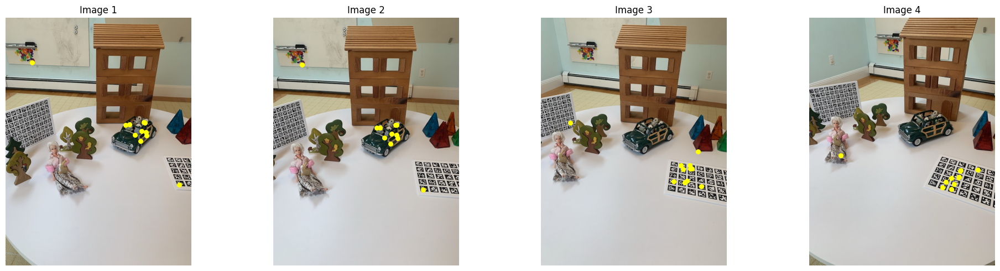

In [36]:
def plot_images_with_inliers(image_paths, points):
    """
    Plots each image with its respective inliers highlighted.
    Parameters:
      image_paths: list of the 4 image paths
      points: list of the common inliers
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    for i, ax in enumerate(axes):
        img = cv2.imread(image_paths[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.scatter(points[i][:, 0], points[i][:, 1], color='yellow', s=30, label='Inliers')
        ax.axis('off')
        ax.set_title(f'Image {i+1}')

    plt.tight_layout()
    plt.show()

plot_images_with_inliers(image_paths, [common_inliers1, common_inliers2, common_inliers3, common_inliers4])

### Tomasi-Kanade Factorization

**Hotel Test Data**

In [37]:
# read measurement matrix
def read_measurement_matrix(path):
    with open(path) as file:
        content = file.readlines()

    for i in range(len(content)):
        row = content[i]
        row = row.strip().split()
        row = list(map(lambda x: float(x), row))
        content[i] = row
    return np.array(content)

In [38]:
W_alternating = read_measurement_matrix("./media/factorization_data/measurement_matrix.txt")
num_frames, num_features = W_alternating.shape
num_frames//=2
num_frames

101

In [39]:
def group_ij(M):
    Wx = M[::2]
    Wy = M[1::2]
    num_frames = M.shape[0]//2
    W =np.zeros_like(M)
    W[:num_frames] = Wx
    W[num_frames:] = Wy
    return W

def alternate_ij(M):
    M_alternating = np.zeros_like(M)
    size = M.shape[0]
    assert size%2==0
    halfsize = size//2

    M_i = M[:halfsize]
    M_j = M[halfsize:]
    for i in range(halfsize):
        M_alternating[2*i] = M_i[i]
        M_alternating[2*i+1] = M_j[i]

    return M_alternating

In [40]:
W = group_ij(W_alternating)

In [41]:
def find_initial_guess(W):
    W_CENTERED = W - np.atleast_2d(W.mean(axis=1)).T
    U, SIG_FLAT, VT = np.linalg.svd(W_CENTERED, full_matrices=False)

    # change rank to 3
    U = U[:,:3]
    SIG = np.diag(SIG_FLAT)[:3,:3]
    VT = VT[:3,:]

    # Compute the initial guess for the motion and structure matrices
    MHAT = U @ np.sqrt(SIG)
    SHAT = np.sqrt(SIG) @ VT

    return MHAT, SHAT

In [42]:
MHAT, SHAT = find_initial_guess(W)

In [43]:
MHAT_i = MHAT[:num_frames]
MHAT_j = MHAT[num_frames:]

In [44]:
def compute_QQT(MHAT:np.ndarray):
    num_frames = MHAT.shape[0]//2
    MHAT_i = MHAT[:num_frames]
    MHAT_j = MHAT[num_frames:]

    # We will find the entries of QQ^T by setting up a system of
    # equations for each entry
    A = np.zeros((3*num_frames, 6))
    b = np.zeros(3*num_frames)
    b[:2*num_frames] = 1



    for i in range(num_frames):

        # The proper i vectors have norm 1
        A[i, 0] = MHAT_i[i,0]**2
        A[i, 1] = 2 * MHAT_i[i,0]* MHAT_i[i,1]
        A[i, 2] = 2 * MHAT_i[i,0]* MHAT_i[i,2]
        A[i, 3] = MHAT_i[i,1]**2
        A[i, 4] = 2 * MHAT_i[i,2]* MHAT_i[i,2]
        A[i, 5] = MHAT_i[i,2]**2

        # The proper j vectors have norm 1

        A[num_frames + i, 0] = MHAT_j[i,0]**2
        A[num_frames + i, 1] = 2 * MHAT_j[i,0]* MHAT_j[i,1]
        A[num_frames + i, 2] = 2 * MHAT_j[i,0]* MHAT_j[i,2]
        A[num_frames + i, 3] = MHAT_j[i,1]**2
        A[num_frames + i, 4] = 2 * MHAT_j[i,2]* MHAT_j[i,2]
        A[num_frames + i, 5] = MHAT_j[i,2]**2

        # The i and j vectors are orthogonal and thus the dot is 0
        A[2 * num_frames + i, 0] = MHAT_i[i,0] * MHAT_j[i,0]
        A[2 * num_frames + i, 1] = MHAT_i[i,0] *  MHAT_j[i,1] + MHAT_i[i,1] *  MHAT_j[i,0]
        A[2 * num_frames + i, 2] = MHAT_i[i,0] *  MHAT_j[i,2] + MHAT_i[i,2] *  MHAT_j[i,2]
        A[2 * num_frames + i, 3] = MHAT_i[i,1] * MHAT_j[i,1]
        A[2 * num_frames + i, 4] = MHAT_i[i,1] *  MHAT_j[i,2] + MHAT_i[i,2] *  MHAT_j[i,1]
        A[2 * num_frames + i, 5] = MHAT_i[i,2] * MHAT_j[i,2]

    qqt_entries, residuals, rank, singular_vals = np.linalg.lstsq(A,b, rcond= None)


    # Assemble QQT
    QQT = np.zeros((3,3))

    QQT[0,0] = qqt_entries[0]
    QQT[1,1] = qqt_entries[3]
    QQT[2,2] = qqt_entries[5]

    QQT[0,1] = qqt_entries[1]
    QQT[1,0] = qqt_entries[1]

    QQT[0,2] = qqt_entries[2]
    QQT[2,0] = qqt_entries[2]

    QQT[1,2] = qqt_entries[4]
    QQT[2,1] = qqt_entries[4]

    return QQT, residuals, rank, singular_vals

In [45]:
QQT, residuals, rank, singular_vals = compute_QQT(MHAT)

In [46]:
QQT

array([[0.01, 0.  , 0.  ],
       [0.  , 0.01, 0.  ],
       [0.  , 0.  , 0.  ]])

In [47]:
# Test whether the QQT actually works
print(MHAT_i[5].T @ QQT @ MHAT_i[5])
print(MHAT_j[2].T @ QQT @ MHAT_j[2])
print(MHAT_i[2].T @ QQT @ MHAT_j[2])
# Seems good enough

0.9365265706564591
0.9679660695320598
0.000407911658383886


In [48]:
# Find Q and compute the actual object points

Q = np.linalg.cholesky(QQT)
QINV = np.linalg.inv(Q)

# Assemble final guess for Motion and Structure.
M = MHAT @ Q
S = QINV @ SHAT

In [49]:
# test whether the norms of the motion matrix are close to 1
np.linalg.norm(M, axis=1).mean()

np.float64(0.9989407455332264)

In [50]:
def compute_object_points(SHAT, QQT=None, Q=None, normalize_size = False):
    if QQT is None and Q is None:
        print("You must give either the QQT or the Q")

    if Q is None:
        Q = np.linalg.cholesky(QQT)

    QINV = np.linalg.inv(Q)

    # Assemble final guess for Motion and Structure.
    S = QINV @ SHAT

    if normalize_size:
        S = S / np.linalg.norm(S, axis=1).mean()
    return S

In [51]:
S = compute_object_points(SHAT, QQT)

In [52]:
# Just in case needed
def normalize_object_size(S):
    return S / np.linalg.norm(S, axis=1).mean()

In [53]:
def visualize_points(S):
    X = S[0]
    Y = S[1]
    Z = S[2]

    object_points = go.Scatter3d(x=X, y=Y, z=-Z, mode='markers', marker=dict(size=2, color=-Z, colorscale='Viridis', opacity=0.8))

    fig = go.Figure(data=[object_points])
    fig.update_layout(title='3D Point Cloud from TK Factorization', autosize=False, width=800, height=800, margin=dict(l=65, r=50, b=65, t=90))
    fig.show()


In [54]:
visualize_points(S)